## Importação do Banco de Dados | Walmart Vendas

In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from huggingface_hub import HfFileSystem
fs = HfFileSystem()

In [48]:
df = pd.read_csv("hf://datasets/Ammok/walmart_sales_prediction/Walmart.csv")
df.tail()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667
6434,45,26-10-2012,760281.43,0,58.85,3.882,192.308899,8.667


In [49]:
df['Store'] = df['Store'].astype('category')
df['Holiday_Flag'] = df['Holiday_Flag'].astype('category')
df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y', errors='coerce')

In [50]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667


In [51]:
df['Weekly_Sales_Million'] = df['Weekly_Sales'] / 1000000

In [52]:
#Descrição das variáveis quantitativas (Desconsiderar Data)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Store                 6435 non-null   category      
 1   Date                  6435 non-null   datetime64[ns]
 2   Weekly_Sales          6435 non-null   float64       
 3   Holiday_Flag          6435 non-null   category      
 4   Temperature           6435 non-null   float64       
 5   Fuel_Price            6435 non-null   float64       
 6   CPI                   6435 non-null   float64       
 7   Unemployment          6435 non-null   float64       
 8   Weekly_Sales_Million  6435 non-null   float64       
dtypes: category(2), datetime64[ns](1), float64(6)
memory usage: 366.1 KB


In [53]:
#Quantidade de fériados na semana (Percentual de aparições)
round(df['Holiday_Flag'].value_counts(normalize=True)*100,2)

,proportion
Holiday_Flag,
0,93.01
1,6.99


## Estatísticas Descritivas (Com algumas correlações)

### Pergunta de Negócio 1: Como é o comportamento de vendas ao longo do Tempo?

Conforme avaliado na série temporal, pode se perceber uma alta sazonalidade no que se diz a respeito de datas de fim de ano, como BlackFriday e Natal em algumas lojas em específico.
No geral, percebe-se que o ponto forte das lojas em geral é o final do ano, com isso é extremamente importante a adaptação de toda a estrutura para recebimento dessa demanda tão elevada nesse período.

Outro ponto a se perceber no gráfico temporal é que início de Janeiro é um período fraco em termos de venda e isso mostra a importância de se preparar sim para os momentos de picos, mas enfrentar essa baixa de compras que é típica em janeiro devido ao volume gasto dos consumidores nos meses anteriores. Ofertas e descontos podem ser uma das alternativas para rotacionar os produtos restantes da loja, mas também movimentar o fluxo de vendas.

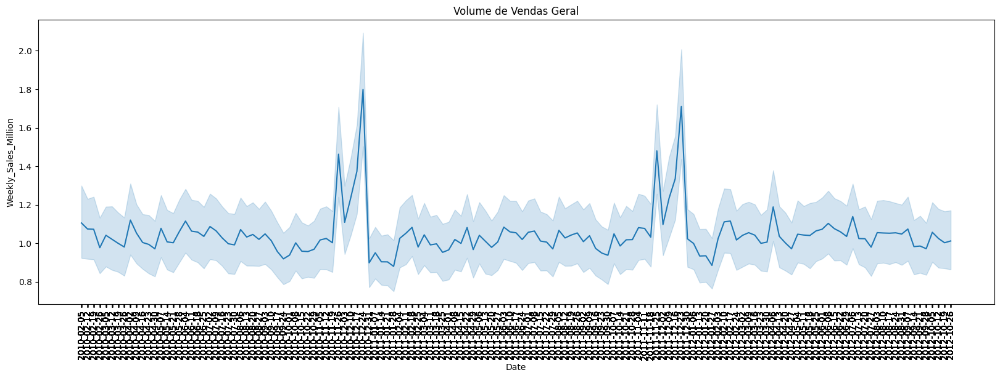

In [55]:
# Volume de Vendas Geral | Índice 90 dias
plt.figure(figsize = (20, 6))
sns.lineplot(data=df,x='Date',y='Weekly_Sales_Million')
xticks = df['Date'].iloc[::2]  # a cada 90 dias
plt.xticks(xticks, rotation='vertical')
plt.title(f'Volume de Vendas Geral')
plt.show()

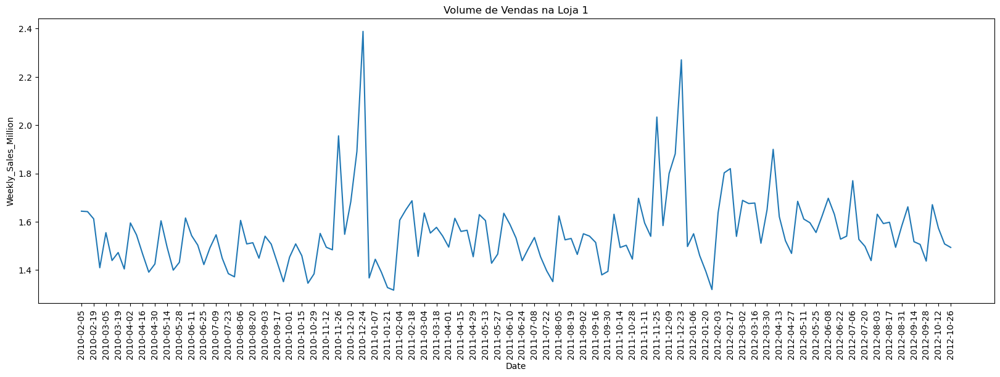

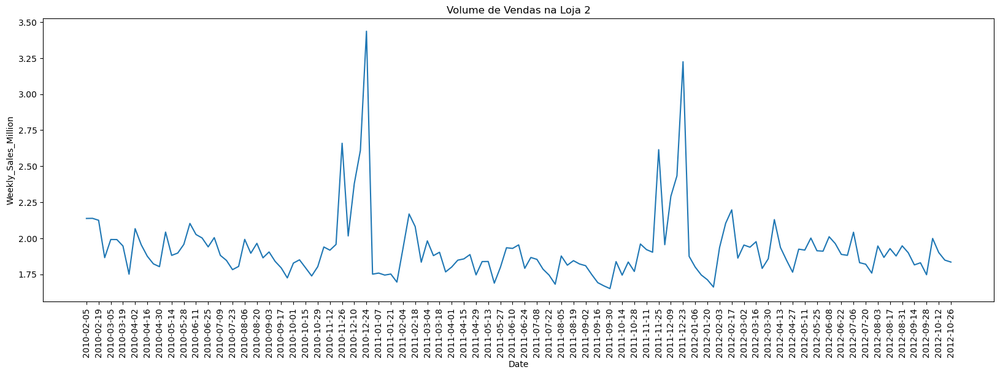

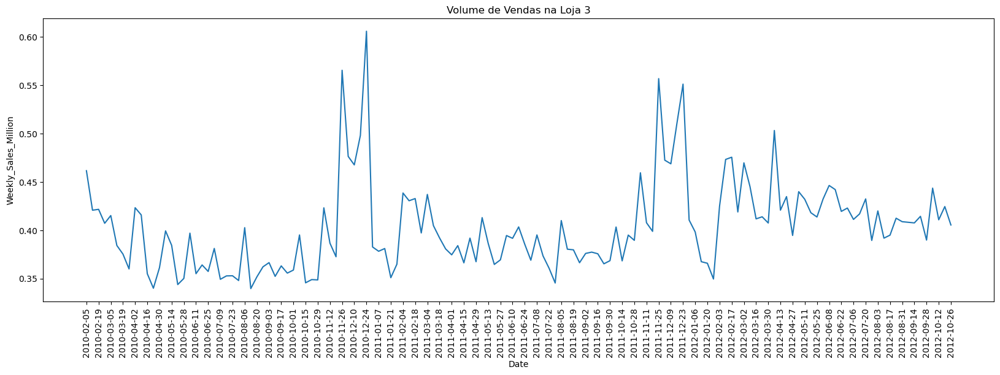

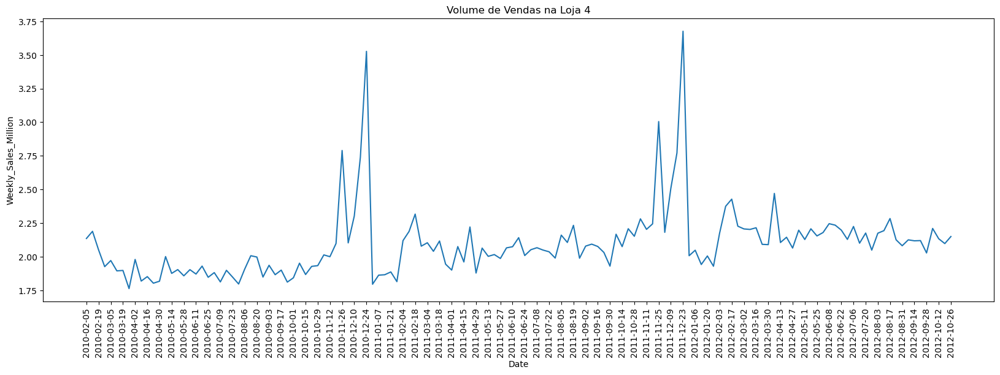

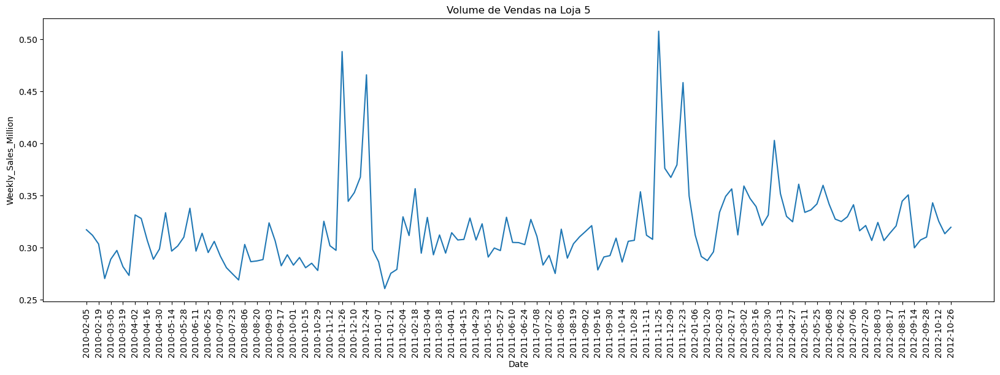

...

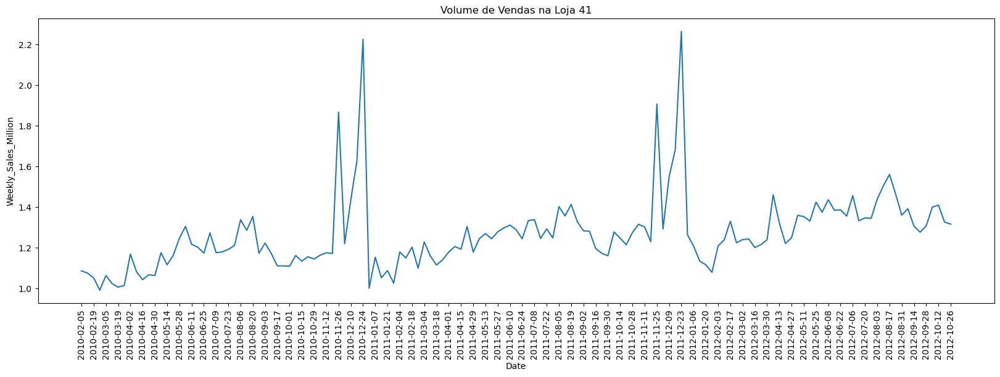

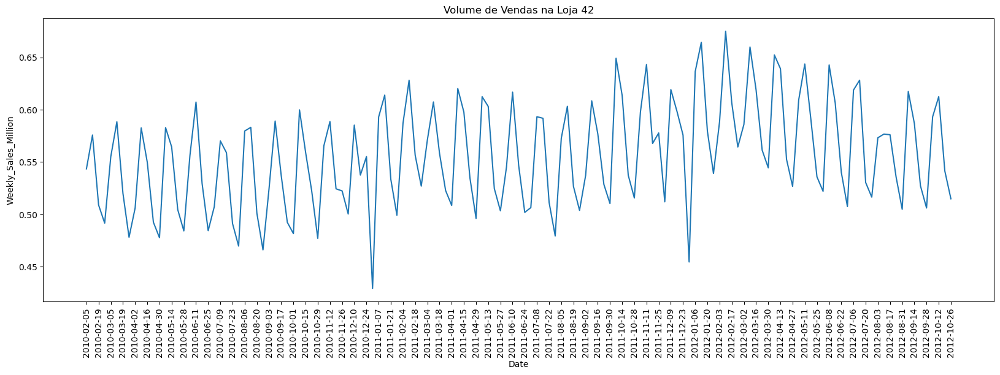

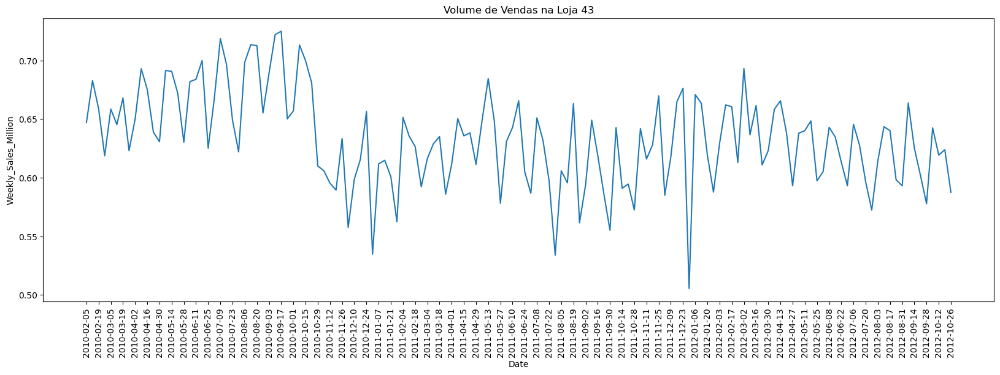

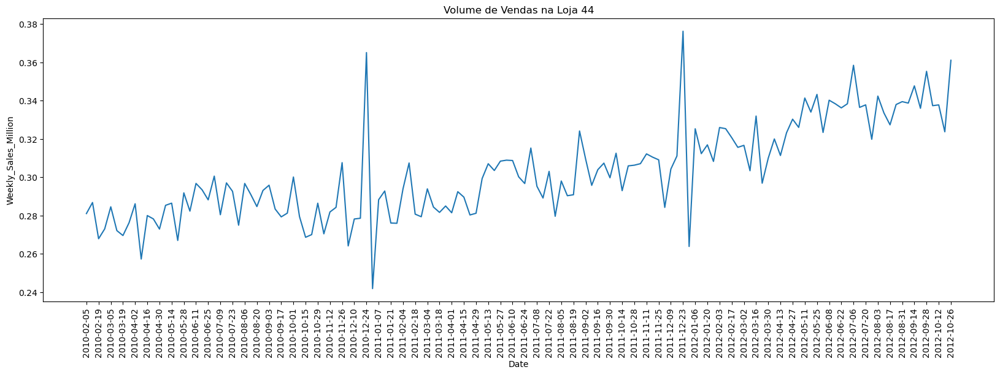

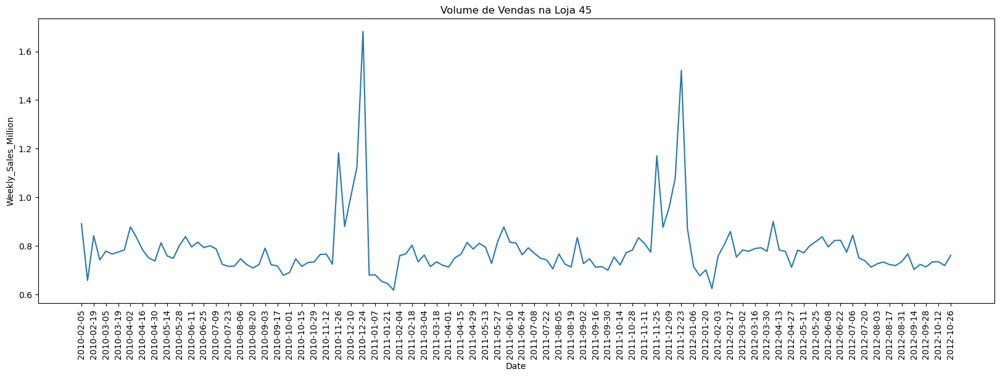

In [ ]:
# Volume de Vendas para cada loja:
for i in df['Store'].unique():
    df1 = df[df['Store'] == i]
    plt.figure(figsize = (20, 6))
    sns.lineplot(data=df1,x='Date',y='Weekly_Sales_Million')
    xticks = df1['Date'].iloc[::2]  # a cada 90 dias
    plt.xticks(xticks, rotation='vertical')
    plt.title(f'Volume de Vendas na Loja {i}')
    plt.show()

### Pergunta de Negócio 2: Como o efeito "Feriados" influencia no valor de gasto de forma geral e para cada Loja?

É possível notar que dentro da média de gastos semanais, o valor tende a ser maior em semanas que possuem feriados. No geral, o valor de Gastos Semanais em semanas com feriados ficou em US1.12milhões. Enquanto as semanas sem feriados, obtiveram uma média de 1.04milhões. Isso  resulta em uma diferença percentual de 7,83%

In [ ]:
#Avaliação Geral do impacto dos feriados
com_fer = df['Weekly_Sales_Million'][df['Holiday_Flag']==1].mean()
sem_fer = df['Weekly_Sales_Million'][df['Holiday_Flag']==0].mean()
print(f'Loja {i}\nMediana de Gastos Semanais (Com Feriado): {com_fer}\nMediana de Gastos Semanais (Sem Feriado): {sem_fer}\n')

(com_fer/sem_fer-1)*100

Loja 45
Mediana de Gastos Semanais (Com Feriado): 1.1228878923555556
Mediana de Gastos Semanais (Sem Feriado): 1.0412563802088555



7.839713033050177

In [ ]:
# Avaliação do impacto para cada loja
for i in df['Store'].unique():
    df1 = df[df['Store'] == i]
    com_fer = df1['Weekly_Sales_Million'][df1['Holiday_Flag']==1].mean()
    sem_fer = df1['Weekly_Sales_Million'][df1['Holiday_Flag']==0].mean()
    print(f'Loja {i}\nMediana de Gastos Semanais (Com Feriado): {com_fer}\nMediana de Gastos Semanais (Sem Feriado): {sem_fer}\n')

Loja 1
Mediana de Gastos Semanais (Com Feriado): 1.665747656
Mediana de Gastos Semanais (Sem Feriado): 1.5469573856390977

Loja 2
Mediana de Gastos Semanais (Com Feriado): 2.0792669
Mediana de Gastos Semanais (Sem Feriado): 1.9142088118796994

Loja 3
Mediana de Gastos Semanais (Com Feriado): 0.43781105
Mediana de Gastos Semanais (Sem Feriado): 0.40006484639097745

Loja 4
Mediana de Gastos Semanais (Com Feriado): 2.2431026240000005
Mediana de Gastos Semanais (Sem Feriado): 2.0835558431578947

Loja 5
Mediana de Gastos Semanais (Com Feriado): 0.35950160699999995
Mediana de Gastos Semanais (Sem Feriado): 0.3148922769172932

Loja 6
Mediana de Gastos Semanais (Com Feriado): 1.6809079270000002
Mediana de Gastos Semanais (Sem Feriado): 1.555992867443609

Loja 7
Mediana de Gastos Semanais (Com Feriado): 0.6724002649999999
Mediana de Gastos Semanais (Sem Feriado): 0.5629644548120301

Loja 8
Mediana de Gastos Semanais (Com Feriado): 0.9753308599999999
Mediana de Gastos Semanais (Sem Feriado): 0.9

### Pergunta de Negócio 3: Existe correlação entre temperatura e vendas?

Sim, Existe porém é bastante variada entre lojas. Grande parte das lojas avaliadas possuem um coeficiente inverso em relação ao volume de vendas semanais, porém em alguns casos mais raros, o coeficiente é nulo ou positivo, o que indica que o fator localização da loja afeta diretamente a essa correlação.

A correlação Geral entre as duas variáveis obteve o valor de -0,06. Isso indica uma associação nao tão forte de forma geral.

Entretanto, quando avaliado a correlação para cada Loja específica, pode se perceber que o valor máximo de correlação ficou em 0,27 e o valor mínimo em -0,43. Além disso, no gráfico de histograma, pode se perceber uma frequência maior perante valores negativos entre as lojas, o que indica que realmente a temperatura possui uma influência negativa, em termos de sinal, no volume de vendas.

In [ ]:
#Correlaçao entre Vendas Semanais e Temperatura (Geral)
corr = round(df.corr().iloc[4,8],2)
corr

-0.06

C:\Users\Felipe\AppData\Local\Temp\ipykernel_12108\3905691693.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (30, 10))


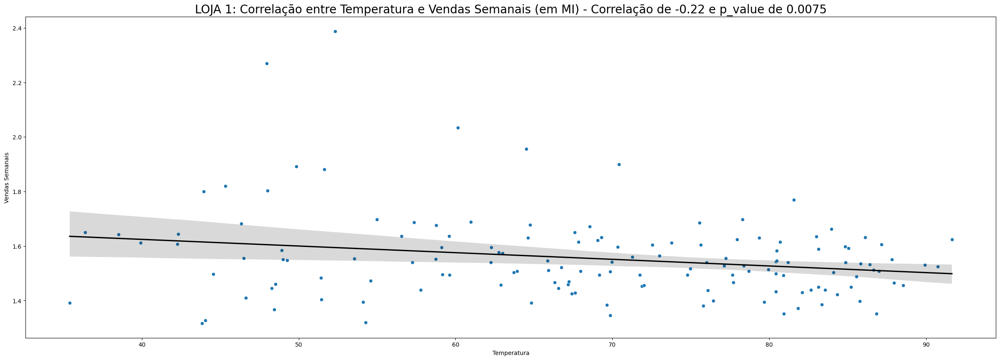

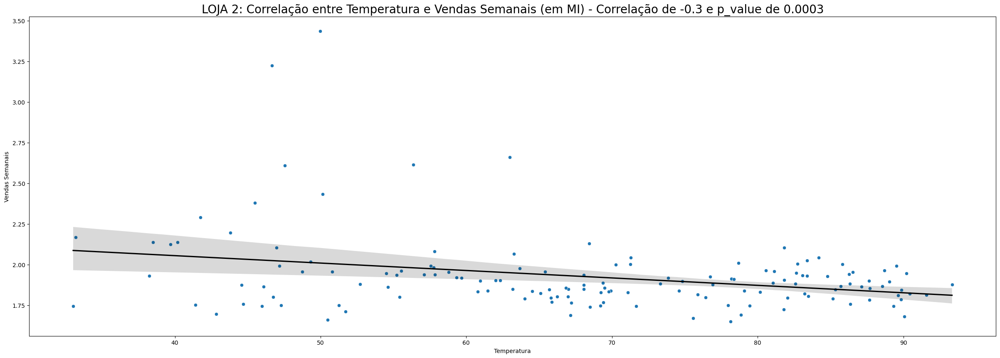

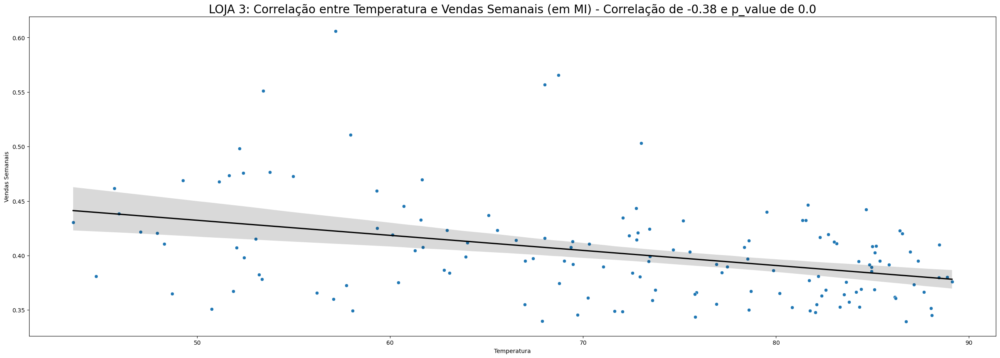

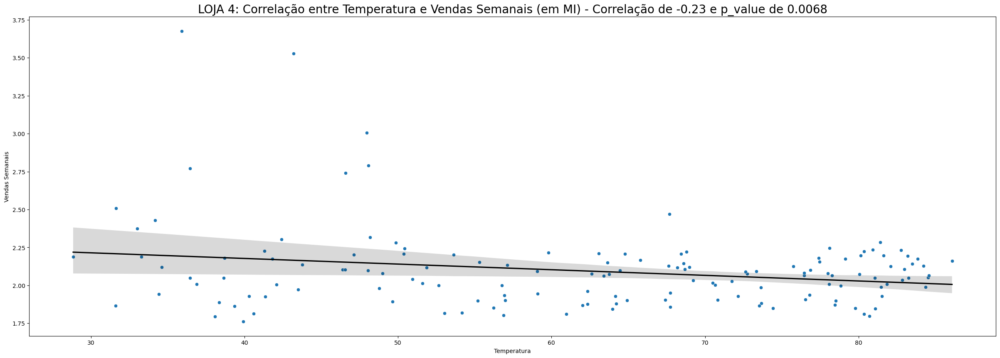

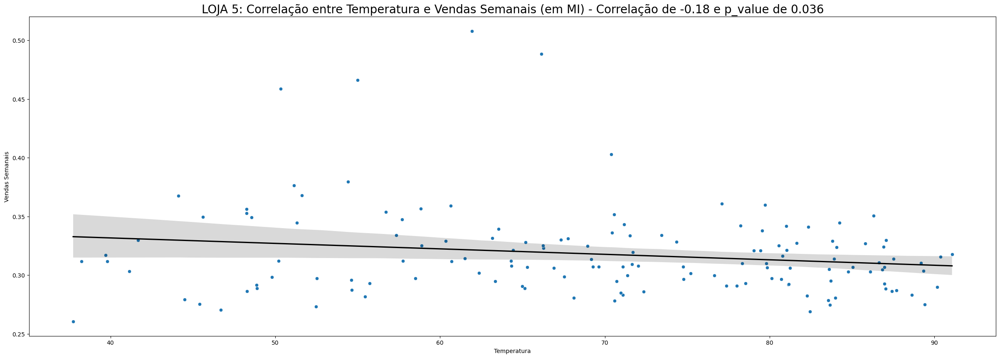

...

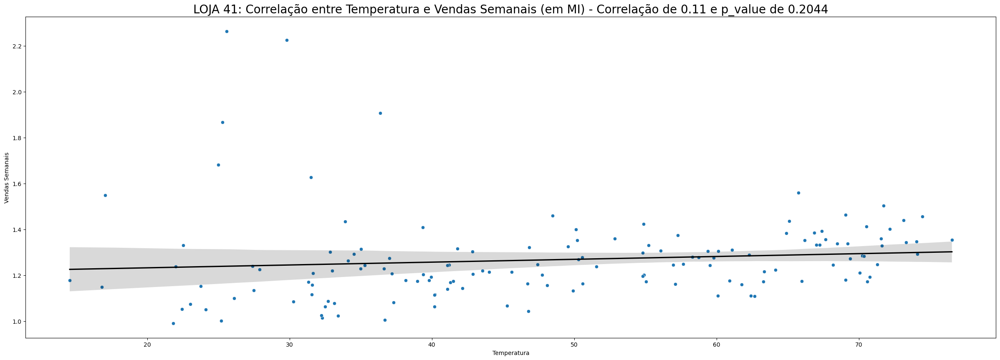

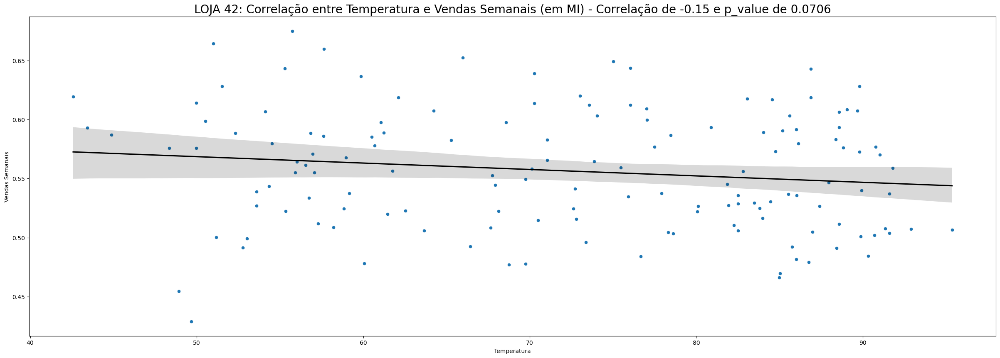

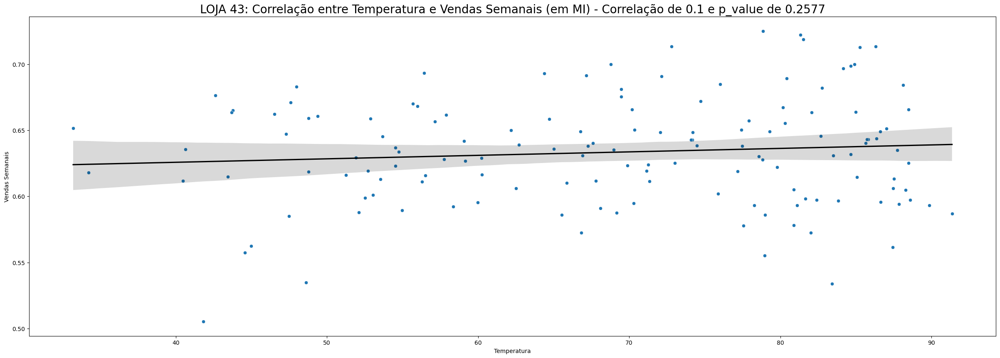

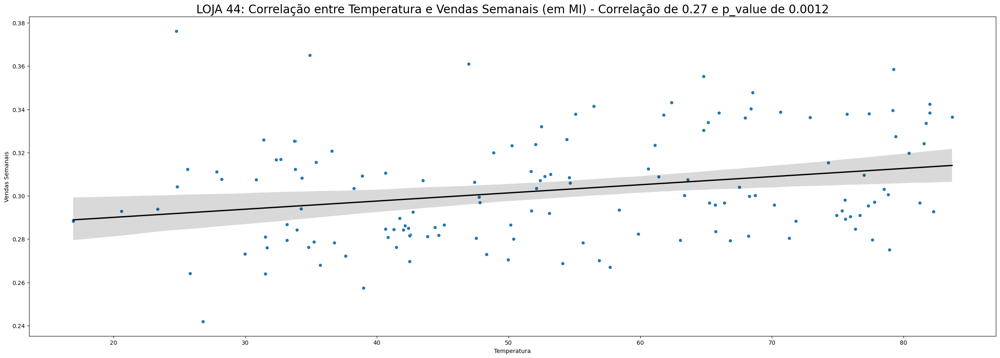

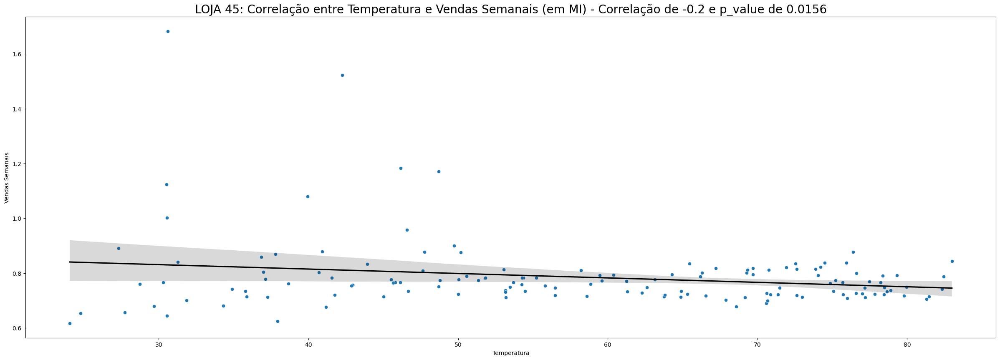

In [ ]:
#Correlação entre Vendas Semanais e Temperatura (Por Loja)
from scipy.stats import pearsonr

lista = []
# Correlação Geral
for i in df['Store'].unique():
    df1 = df[df['Store'] == i]
    #corr = round(df1.corr().iloc[4,8],2)
    corr, p_val = pearsonr(df1['Temperature'], df1['Weekly_Sales_Million'])
    lista.append(corr)
    plt.figure(figsize = (30, 10))
    sns.scatterplot(data=df1, x='Temperature', y='Weekly_Sales_Million')
    sns.regplot(data=df1, x='Temperature', y='Weekly_Sales_Million', scatter=False, color='black')
    plt.title(f'LOJA {i}: Correlação entre Temperatura e Vendas Semanais (em MI) - Correlação de {round(corr,2)} e p_value de {round(p_val,4)}', fontsize=20)
    plt.xlabel('Temperatura', fontsize=10)
    plt.ylabel('Vendas Semanais', fontsize=10)

Valor Máximo de Correlação: 0.27
Valor Mínimo de Correlação: -0.43


(array([4., 4., 6., 5., 8., 3., 5., 7., 1., 2.]),
 array([-0.43256869, -0.3625296 , -0.29249051, -0.22245142, -0.15241234,
        -0.08237325, -0.01233416,  0.05770493,  0.12774402,  0.1977831 ,
         0.26782219]),
 <BarContainer object of 10 artists>)

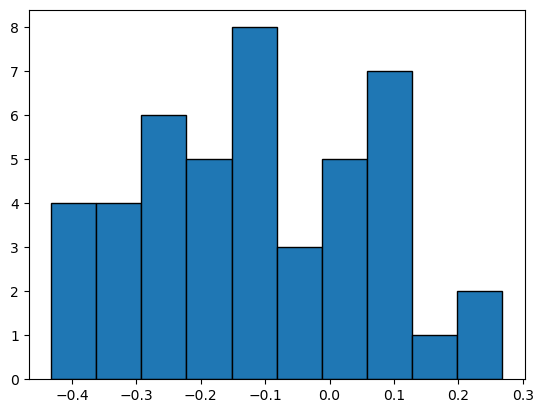

In [ ]:
#Gráfico de Correlação (Histograma de todas as lojas)
print(f'Valor Máximo de Correlação: {round(max(lista),2)}\nValor Mínimo de Correlação: {round(min(lista),2)}')
plt.hist(lista, bins=10, edgecolor="black")

### Pergunta de Negócio 4: Como variáveis econômicas influenciam as vendas?

Ambas as variáveis de CPI e Desemprego se mostram com coeficiente negativo conforme o valor de vendas, sendo -0,07 e -0,10, respectivamente. Além disso, as correlações são significativas, com um p-valor abaixo de 0.01.

Porém, é necessário se atentar que as variáveis econômicas possuem correlação entre si e esse fator de correlação em um trabalho de regressão com a variável Vendas Semanais sendo a dependente e as demais preditoras, podem apresentar um aspecto de multicolinearidade, que basicamente se refere a correlação entre variáveis preditoras

In [ ]:
#Correlaçao de todas as variáveis (incluindo as vendas semanais)
import pingouin as pg
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

corr1b = pg.rcorr(df, method='pearson',
                  upper='pval', decimals=6,
                  pval_stars={0.01: '***',
                              0.05: '**',
                              0.10: '*'})

corr1b

,Weekly_Sales,Temperature,Fuel_Price,CPI,Unemployment,Weekly_Sales_Million
Weekly_Sales,-,***,,***,***,***
Temperature,-0.06381,-,***,***,***,***
Fuel_Price,0.009464,0.144982,-,***,***,
CPI,-0.072634,0.176888,-0.170642,-,***,***
Unemployment,-0.106176,0.101158,-0.034684,-0.30202,-,***
Weekly_Sales_Million,1.0,-0.06381,0.009464,-0.072634,-0.106176,-


## Estatísticas Inferencial

### Rodando OLS (Sem e Com transformação BoxCox) | Para a Loja 1

Realizando a primeira modelagem (desconsiderando o efeito Loja), obteve um resultado não tão interessante em termos de explicação do modelo. A Hipotese Nula foi rejeitada no teste de normalidade da variável depedente e por conta disso foi elaborado o método por transformação BoxCox. Porém mesmo realizando a transformação, foi notado que o teste acusou uma normalidade dos dados.

Após o método Stepwise, foi identificado que as variáveis Temperature, CPI e Unemployment se mostraram estatísticamente significantes, com coeficientes negativos, indicando que quanto menor for esses valores, maiores serão os valores de vendas.

Entretanto, é possível melhorar esse modelo se considerarmos como um modelo em painel tratando de forma multinível (Iremos realizar com maior detalhes mais para frente)

In [12]:
!pip install -q statstests

In [13]:
import statsmodels.api as sm # estimação de modelos
from statsmodels.iolib.summary2 import summary_col # comparação entre modelos
from sklearn.preprocessing import LabelEncoder # transformação de dados
from statstests.process import stepwise # procedimento Stepwise
from statstests.tests import shapiro_francia # teste de Shapiro-Francia
from scipy.stats import boxcox # transformação de Box-Cox
from scipy.stats import norm # para plotagem da curva normal
from scipy import stats # utilizado na definição da função 'breusch_pagan_test'
from statstests.process import stepwise

#### OLS (Antes da Transformação)

In [ ]:
# Colunas do DataFrame
df.columns

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment', 'Weekly_Sales_Million'],
      dtype='object')

In [16]:
df_ols = df[df['Store'] == 1]
df_ols.head(2)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Weekly_Sales_Million
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,1.643691
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,1.641957


Text(0.5, 1.0, 'Histograma da variável dependente transformada')

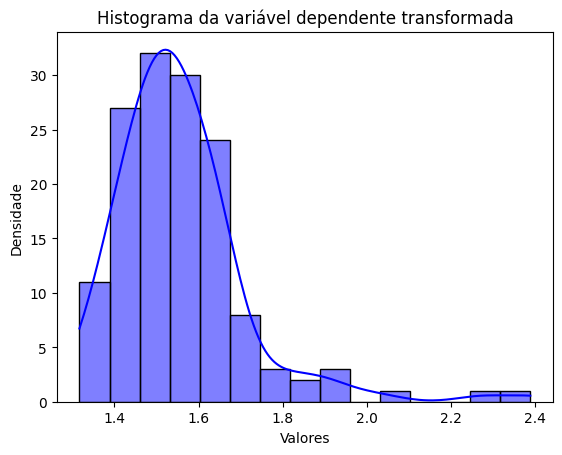

In [18]:
#Plotando o gráfico:
sns.histplot(df_ols, x='Weekly_Sales_Million',bins=15, kde=True, color='blue', edgecolor='black')
plt.xlabel('Valores')
plt.ylabel('Densidade')
plt.title('Histograma da variável dependente transformada')

In [17]:
# Estimação de um modelo OLS linear
modelo_linear = sm.OLS.from_formula('Weekly_Sales_Million ~ Holiday_Flag + Temperature + Fuel_Price + CPI + Unemployment', df_ols).fit()

# Parâmetros do 'modelo_linear'
modelo_linear.summary()

# Estimação do modelo por meio do procedimento Stepwise
modelo_step_linear = stepwise(modelo_linear, pvalue_limit=0.05)

Regression type: OLS 

Estimating model...: 
 Weekly_Sales_Million ~ Q('Holiday_Flag[T.1]') + Q('Temperature') + Q('Fuel_Price') + Q('CPI') + Q('Unemployment')

 Discarding atribute "Q('Fuel_Price')" with p-value equal to 0.6079830657047924 

Estimating model...: 
 Weekly_Sales_Million ~ Q('Holiday_Flag[T.1]') + Q('Temperature') + Q('CPI') + Q('Unemployment')

 Discarding atribute "Q('Unemployment')" with p-value equal to 0.2054167680418054 

Estimating model...: 
 Weekly_Sales_Million ~ Q('Holiday_Flag[T.1]') + Q('Temperature') + Q('CPI')

 Discarding atribute "Q('Holiday_Flag[T.1]')" with p-value equal to 0.05148489775379138 

Estimating model...: 
 Weekly_Sales_Million ~ Q('Temperature') + Q('CPI')

 No more atributes with p-value higher than 0.05

 Atributes discarded on the process...: 

{'atribute': "Q('Fuel_Price')", 'p-value': 0.6079830657047924}
{'atribute': "Q('Unemployment')", 'p-value': 0.2054167680418054}
{'atribute': "Q('Holiday_Flag[T.1]')", 'p-value': 0.0514848977537913

In [19]:
from statstests.tests import shapiro_francia

# Teste de Shapiro-Francia: interpretação
teste_sf = shapiro_francia(modelo_linear.resid) #criação do objeto 'teste_sf'
teste_sf = teste_sf.items() #retorna o grupo de pares de valores-chave no dicionário
method, statistics_W, statistics_z, p = teste_sf #definição dos elementos da lista (tupla)
print('Statistics W=%.5f, p-value=%.6f' % (statistics_W[1], p[1]))
alpha = 0.05 #nível de significância
if p[1] > alpha:
	print('Não se rejeita H0 - Distribuição aderente à normalidade')
else:
	print('Rejeita-se H0 - Distribuição não aderente à normalidade')

method  :  Shapiro-Francia normality test
statistics W  :  0.8458124443246491
statistics z  :  5.945431727008996
p-value  :  1.3786457849031125e-09
Statistics W=0.84581, p-value=0.000000
Rejeita-se H0 - Distribuição não aderente à normalidade


#### OLS (Pós da Transformação)

In [20]:
yast, lmbda = boxcox(df_ols['Weekly_Sales_Million'])

# Inserção da variável transformada ('bc_comprimento') no dataset para a estimação de um novo modelo
df_ols['bc_Sales_Million'] = yast

<ipython-input-20-b961b56e3e38>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ols['bc_Sales_Million'] = yast


Text(0.5, 1.0, 'Histograma da variável dependente transformada')

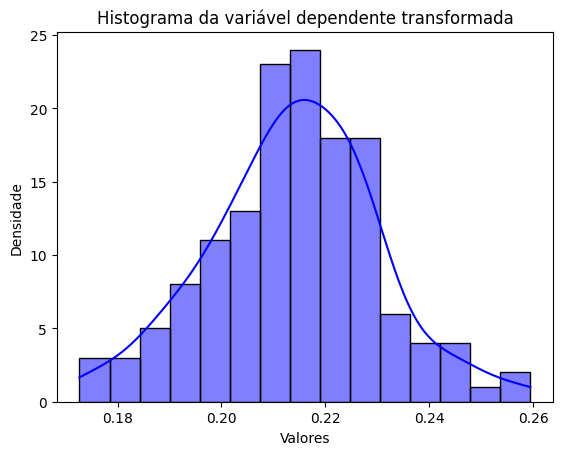

In [21]:
#Plotando o gráfico:
sns.histplot(df_ols, x='bc_Sales_Million', bins=15, kde=True, color='blue', edgecolor='black')
plt.xlabel('Valores')
plt.ylabel('Densidade')
plt.title('Histograma da variável dependente transformada')

In [22]:
#Estimando um novo modelo OLS com variável dependente transformada por Box-Cox

modelo_bc = sm.OLS.from_formula('bc_Sales_Million ~ Holiday_Flag + Temperature + Fuel_Price + CPI + Unemployment', df_ols).fit()

# Parâmetros do 'modelo_bc'
modelo_bc.summary()

modelo_step_bc = stepwise(modelo_bc, pvalue_limit=0.05)

Regression type: OLS 

Estimating model...: 
 bc_Sales_Million ~ Q('Holiday_Flag[T.1]') + Q('Temperature') + Q('Fuel_Price') + Q('CPI') + Q('Unemployment')

 Discarding atribute "Q('Fuel_Price')" with p-value equal to 0.9288221052893172 

Estimating model...: 
 bc_Sales_Million ~ Q('Holiday_Flag[T.1]') + Q('Temperature') + Q('CPI') + Q('Unemployment')

 Discarding atribute "Q('Unemployment')" with p-value equal to 0.3174952479326825 

Estimating model...: 
 bc_Sales_Million ~ Q('Holiday_Flag[T.1]') + Q('Temperature') + Q('CPI')

 Discarding atribute "Q('Holiday_Flag[T.1]')" with p-value equal to 0.05479772464171794 

Estimating model...: 
 bc_Sales_Million ~ Q('Temperature') + Q('CPI')

 No more atributes with p-value higher than 0.05

 Atributes discarded on the process...: 

{'atribute': "Q('Fuel_Price')", 'p-value': 0.9288221052893172}
{'atribute': "Q('Unemployment')", 'p-value': 0.3174952479326825}
{'atribute': "Q('Holiday_Flag[T.1]')", 'p-value': 0.05479772464171794}

 Model after

In [23]:
# Teste de Shapiro-Francia: interpretação
teste_sf = shapiro_francia(modelo_step_bc.resid) #criação do objeto 'teste_sf'
teste_sf = teste_sf.items() #retorna o grupo de pares de valores-chave no dicionário
method, statistics_W, statistics_z, p = teste_sf #definição dos elementos da lista (tupla)
print('Statistics W=%.5f, p-value=%.6f' % (statistics_W[1], p[1]))
alpha = 0.05 #nível de significância
if p[1] > alpha:
	print('Não se rejeita H0 - Distribuição aderente à normalidade')
else:
	print('Rejeita-se H0 - Distribuição não aderente à normalidade')

method  :  Shapiro-Francia normality test
statistics W  :  0.9807685394090678
statistics z  :  1.7342566328252496
p-value  :  0.041436279246077096
Statistics W=0.98077, p-value=0.041436
Rejeita-se H0 - Distribuição não aderente à normalidade


### Modelagem Multinivel (Dados em Painel)

De acordo com a avaliação das modelagens foi possível perceber uma melhor adaptação para o modelo POLS com adição das dummies de Lojas que se mostraram altamente relevantes perante o indicador alvo de Vendas Semanais. Além disso, foi possível perceber que nos modelos, as variáveis econômicas como Desemprego e CPI de fato influenciam com coeficiente negativo no valor de Vendas.

Entretanto, o que mais obteve peso na avaliação foi especificamente a qual loja pertencia a venda, o que indica que cada uma das empresas possuem particularidades, além do tempo que se mostrou relevante (Iremos realizar modelagem especificamente para Series Temporais para cada uma das lojas)

In [25]:
!pip install -q linearmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.7/115.7 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.9/43.9 kB 2.0 MB/s eta 0:00:00


In [26]:
from linearmodels import PooledOLS #estimação de modelos POLS com erros-padrão
#robustos
from statsmodels.stats.diagnostic import het_breuschpagan #teste de Breusch Pagan
from linearmodels import PanelOLS #estimação de modelos em painel POLS e com
#efeitos fixos e erros-padrão robustos
from linearmodels import RandomEffects #estimação de modelos com efeitos aleatórios
import statsmodels.formula.api as smf

#### Avaliação Inicial (Estatísticas Básicas de Painel)

In [ ]:
df.columns

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment', 'Weekly_Sales_Million'],
      dtype='object')

**Primeira Análise**: Conforme o gráfico abaixo, é notável que os fenômenos de tempo e loja variam entre si quando é avaliado a variável dependente (Vendas Semanais)

In [28]:
lista_dict = []

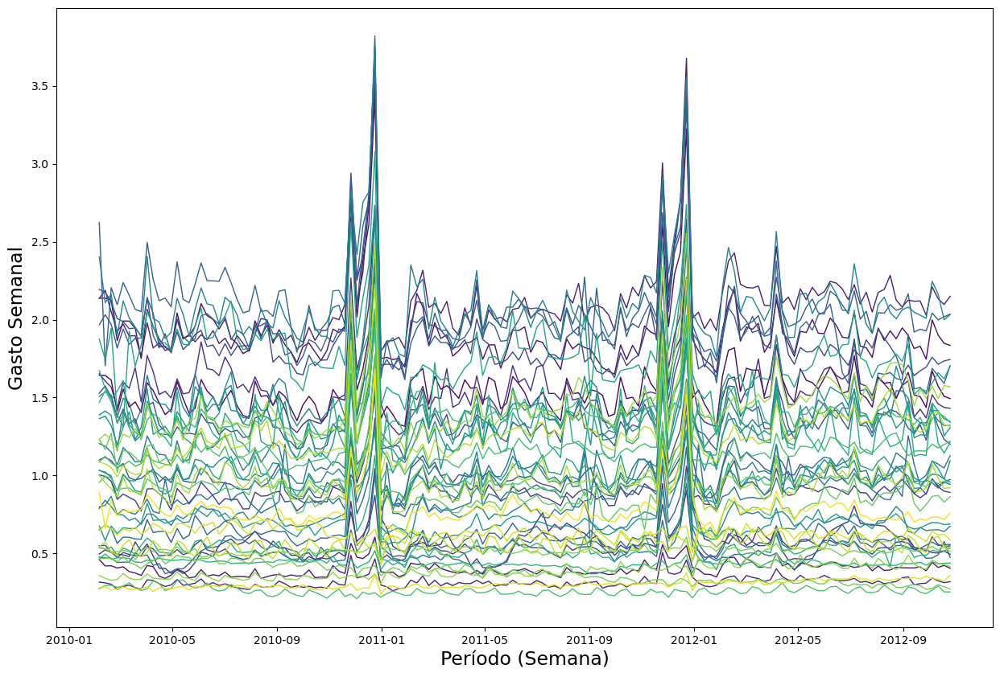

In [ ]:
# Gráfico do comportamento do Vendas Semanal de cada Loja ao longo do tempo – gráfico unificado
plt.figure(figsize=(15,10))
sns.lineplot(x='Date', y='Weekly_Sales_Million', hue='Store',
             data=df, linewidth=1, palette='viridis')
plt.legend().set_visible(False)
plt.xlabel('Período (Semana)', fontsize=17)
plt.ylabel('Gasto Semanal', fontsize=17)
plt.show()

Com o código abaixo, foi realizado umas das avaliações mais importantes para escolha do tipo de modelo de painel que é o entendimento da variância em cada índividuo Loja (Within), a variância entre indíviduos Loja (Between) e a variação Geral (Overall)

Com essa estatística, pode-se notar que em maior parte das variáveis, a variância Within acaba sendo predominante, assim indicando uma possibilidade de melhor explicação dentro dos grupos de acordo com o tempo que as Vendas acontecem.

In [29]:
# Formula de Calculo Between, Within e Overall (Estatísticas para avaliação dos dados em painel)
for column in df.columns:
    if column != 'Store' and column != 'Date' and column != 'Holiday_Flag':
        media_cidade = df.groupby('Store')[column].transform('mean')
        media_geral = df[column].mean()
        #print(media_geral)

        media_cidade_dist = df.groupby('Store')[column].mean().reset_index()
        list_col = ['Date', 'Store']

        #Calculo da Metrica Within:
        within_1 = (df[column] - media_cidade)**2
        within_1 = pd.DataFrame(within_1)
        within_1_concat = pd.concat([within_1, df[list_col]], axis=1)
        #print(within_1_concat)

        sum_w = within_1.sum()
        sum_w
        t = len(within_1) - 1
        t
        within_final = np.float64((within_1.sum() / 303).iloc[0])
        #within_final = np.float64[0]

        #Calculo da Metrica Between
        media_cidade_dist['Between'] = ((media_cidade_dist[column] - media_geral)**2)
        beetween_1 = (media_cidade_dist[column] - media_geral)**2
        beetween_final = beetween_1.sum() / 37

        #Calculo da Metrica Between
        overall_1 = (df[column] - media_geral)**2
        overall_final = overall_1.sum() / t

        #print(within_final, ' | ', beetween_final)

        if within_final > beetween_final:

            comparacao = 'Maior Within'
            print(' Variável:', column, '\n',
                  'Within:', within_final, '\n',
                  'Beetween:', beetween_final, '\n',
                  'Overall:', overall_final, '\n',
                  'Comparação: Maior Within', '\n')
        else:
            comparacao = 'Maior Between'
            print(' Variável:', column, '\n',
                  'Within:', within_final, '\n',
                  'Beetween:', beetween_final, '\n',
                  'Overall:', overall_final, '\n',
                  'Comparação: Maior Between', '\n')

        dict_ = {'Variavel': column,
                 'Within':within_final,
                 'Between':beetween_final,
                 'Overall':overall_final}

        lista_dict.append(dict_)

 Variável: Weekly_Sales 
 Within: 558547713756.5522 
 Beetween: 355330060509.52435 
 Overall: 318509684088.30096 
 Comparação: Maior Within 

 Variável: Temperature 
 Within: 5229.665812998223 
 Beetween: 114.22379504761938 
 Overall: 340.21554879319484 
 Comparação: Maior Within 

 Variável: Fuel_Price 
 Within: 4.010372505296683 
 Beetween: 0.02655359784431115 
 Overall: 0.21069909159141206 
 Comparação: Maior Within 

 Variável: CPI 
 Within: 228.2823351170937 
 Beetween: 1870.4932748409947 
 Overall: 1548.950802723684 
 Comparação: Maior Between 

 Variável: Unemployment 
 Within: 8.337537219044982 
 Beetween: 3.8016651075051575 
 Overall: 3.518943714824436 
 Comparação: Maior Within 

 Variável: Weekly_Sales_Million 
 Within: 0.5585477137565521 
 Beetween: 0.35533006050952437 
 Overall: 0.318509684088301 
 Comparação: Maior Within 



<ipython-input-29-7ac85febca51>:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  media_cidade = df.groupby('Store')[column].transform('mean')
<ipython-input-29-7ac85febca51>:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  media_cidade_dist = df.groupby('Store')[column].mean().reset_index()
<ipython-input-29-7ac85febca51>:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  media_cidade = df.groupby('Store')[column].transfor

#### Modelo POLS com Erros Robustos:

In [30]:
grupos = df['Store']

In [31]:
import statsmodels.formula.api as smf

# Estimação do modelo OLS com fórmula
modelo_pols = smf.ols(
    formula='Weekly_Sales_Million ~ Holiday_Flag + Temperature + Fuel_Price + CPI + Unemployment',
    data=df
).fit()

# Adiciona erros-padrão robustos com cluster por loja
modelo_pols_robust_clustered = modelo_pols.get_robustcov_results(
    cov_type='cluster',
    groups=df['Store']
)

# Visualiza o resumo
print(modelo_pols_robust_clustered.summary())

modelo_pols_robust_clustered_step = stepwise(modelo_pols_robust_clustered, pvalue_limit=0.05)

                             OLS Regression Results                             
Dep. Variable:     Weekly_Sales_Million   R-squared:                       0.025
Model:                              OLS   Adj. R-squared:                  0.025
Method:                   Least Squares   F-statistic:                     24.58
Date:                  Fri, 30 May 2025   Prob (F-statistic):           9.99e-12
Time:                          18:55:53   Log-Likelihood:                -5366.3
No. Observations:                  6435   AIC:                         1.074e+04
Df Residuals:                      6429   BIC:                         1.079e+04
Df Model:                             5                                         
Covariance Type:                cluster                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept         

#### Modelo POLS (Dummies)

In [ ]:
df.columns

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment', 'Weekly_Sales_Million'],
      dtype='object')

In [32]:
base_dummizada = pd.get_dummies(df,
                                columns=['Store'], drop_first=True)
base_dummizada

# Estimação propriamente dita (modelo MQO com dummies)
# Definição da expressão a ser utilizada no modelo
lista_colunas = list(base_dummizada.drop(columns=['Date',
                                                  'Weekly_Sales_Million',
                                                  'Weekly_Sales']).columns)
formula_dummies_modelo = ' + '.join(lista_colunas)
formula_dummies_modelo = "Weekly_Sales_Million ~ " + formula_dummies_modelo

# Estimação do 'modelo_pols_dummies'
modelo_pols_dummies = sm.OLS.from_formula(formula_dummies_modelo,
                                          base_dummizada).fit()

# Parâmetros do 'modelo_pols_dummies'
modelo_pols_dummies.summary()


modelo_pols_dummies_step = stepwise(modelo_pols_dummies, pvalue_limit=0.05)

Regression type: OLS 

Estimating model...: 
 Weekly_Sales_Million ~ Q('Holiday_Flag[T.1]') + Q('Store_2[T.True]') + Q('Store_3[T.True]') + Q('Store_4[T.True]') + Q('Store_5[T.True]') + Q('Store_6[T.True]') + Q('Store_7[T.True]') + Q('Store_8[T.True]') + Q('Store_9[T.True]') + Q('Store_10[T.True]') + Q('Store_11[T.True]') + Q('Store_12[T.True]') + Q('Store_13[T.True]') + Q('Store_14[T.True]') + Q('Store_15[T.True]') + Q('Store_16[T.True]') + Q('Store_17[T.True]') + Q('Store_18[T.True]') + Q('Store_19[T.True]') + Q('Store_20[T.True]') + Q('Store_21[T.True]') + Q('Store_22[T.True]') + Q('Store_23[T.True]') + Q('Store_24[T.True]') + Q('Store_25[T.True]') + Q('Store_26[T.True]') + Q('Store_27[T.True]') + Q('Store_28[T.True]') + Q('Store_29[T.True]') + Q('Store_30[T.True]') + Q('Store_31[T.True]') + Q('Store_32[T.True]') + Q('Store_33[T.True]') + Q('Store_34[T.True]') + Q('Store_35[T.True]') + Q('Store_36[T.True]') + Q('Store_37[T.True]') + Q('Store_38[T.True]') + Q('Store_39[T.True]') + Q(

#### Modelagem por Efeitos Fixos

In [33]:
# Definição dos vetores de variáveis explicativas e do vetor com a dependente
df_panel = df.set_index(['Store', 'Date'])  # se tiver uma coluna de tempo

modelo_fe = PanelOLS.from_formula(
    'Weekly_Sales_Million ~ Holiday_Flag + Temperature + Fuel_Price + CPI + Unemployment + EntityEffects',
    data=df_panel
).fit(cov_type='clustered', cluster_entity=True)

modelo_fe.summary

/usr/local/lib/python3.11/dist-packages/linearmodels/panel/data.py:590: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_mu = self._frame.groupby(level=level).transform("mean")
/usr/local/lib/python3.11/dist-packages/linearmodels/panel/data.py:590: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_mu = self._frame.groupby(level=level).transform("mean")
/usr/local/lib/python3.11/dist-packages/linearmodels/panel/data.py:680: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to

Dep. Variable:,Weekly_Sales_Million,R-squared:,0.0325
Estimator:,PanelOLS,R-squared (Between):,-0.0786
No. Observations:,6435,R-squared (Within):,0.0325
Date:,"Fri, May 30 2025",R-squared (Overall):,-0.0694
Time:,18:57:03,Log-likelihood,2681.2
Cov. Estimator:,Clustered,,
,,F-statistic:,42.844
Entities:,45,P-value,0.0000
Avg Obs:,143.00,Distribution:,"F(5,6385)"
Min Obs:,143.00,,
Max Obs:,143.00,F-statistic (robust):,248.67


In [ ]:
efeitos_fixos = modelo_fe.estimated_effects
ef_stores = efeitos_fixos.groupby('Store')['estimated_effects'].mean()

#### Efeitos Aleatórios

In [34]:
# Definição dos vetores de variáveis explicativas e do vetor com a dependente
X = sm.add_constant(df_panel[['Holiday_Flag', 'Temperature','Fuel_Price', 'CPI', 'Unemployment']])
y = df_panel['Weekly_Sales_Million']

# Estimação propriamente dita do modelo com efeitos aleatórios
modelo_re = RandomEffects(y, X).fit()
modelo_re

/usr/local/lib/python3.11/dist-packages/linearmodels/panel/data.py:599: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  weighted_sum: DataFrame = frame.groupby(level=level).transform("sum")
/usr/local/lib/python3.11/dist-packages/linearmodels/panel/data.py:601: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sum_weights: DataFrame = frame.groupby(level=level).transform("sum")
/usr/local/lib/python3.11/dist-packages/linearmodels/panel/data.py:599: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or o

Dep. Variable:,Weekly_Sales_Million,R-squared:,0.0319
Estimator:,RandomEffects,R-squared (Between):,-0.0448
No. Observations:,6435,R-squared (Within):,0.0324
Date:,"Fri, May 30 2025",R-squared (Overall):,-0.0385
Time:,18:57:32,Log-likelihood,2659.7
Cov. Estimator:,Unadjusted,,
,,F-statistic:,42.368
Entities:,45,P-value,0.0000
Avg Obs:,143.00,Distribution:,"F(5,6429)"
Min Obs:,143.00,,
Max Obs:,143.00,F-statistic (robust):,42.368


In [ ]:
# Theta do 'modelo_re'
theta = modelo_re.theta.iloc[1]
theta

0.9270685527032388

In [ ]:
# Sigma_e do 'modelo_re'
sigma_e = np.sqrt(modelo_re._sigma2_eps)
sigma_e

0.16014196012096463

In [ ]:
# Sigma_u do 'modelo_re'
sigma_u = np.sqrt(modelo_re._sigma2_effects)
sigma_u

0.570957324505286

In [ ]:
# Obtenção direta do rho do 'modelo_re'
rho = modelo_re._rho
print(f'{round(rho*100,2)}% da variação de Vendas Semanais se dá pelo fator Loja')

92.71% da variação de Vendas Semanais se dá pelo fator Loja


#### Comparação dos Modelos

In [ ]:
df_panel['fitted_pols'] = modelo_pols_robust_clustered_step.fittedvalues.values
df_panel['fitted_fe'] = modelo_fe.fitted_values
df_panel['fitted_re'] = modelo_re.fitted_values
df_panel['fitted_pols_dummies'] = modelo_pols_dummies.fittedvalues.values

df_panel['fitted_pols'].describe()

count    6435.000000
mean        1.046965
std         0.089911
min         0.828343
25%         0.989401
50%         1.038392
75%         1.100485
max         1.354007
Name: fitted_pols, dtype: float64

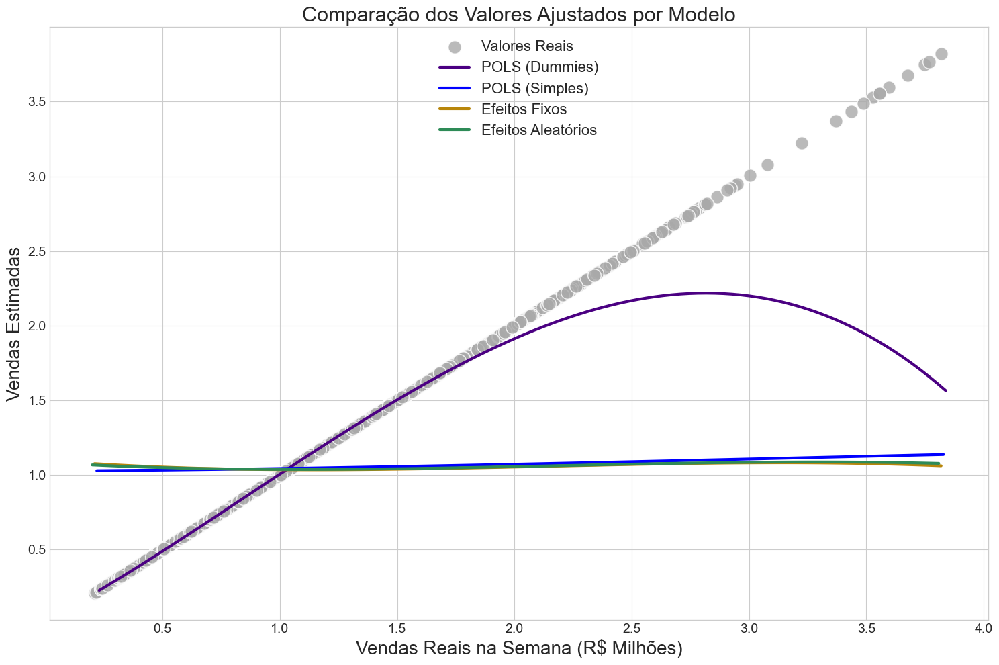

In [ ]:
plt.figure(figsize=(15, 10))
with plt.style.context('seaborn-v0_8-whitegrid'):
    # Valores reais
    sns.scatterplot(x='Weekly_Sales_Million', y='Weekly_Sales_Million',
                    data=df_panel, color='darkgrey', s=200,
                    label='Valores Reais', alpha=0.8)

    # POLS (com dummies) – jitter leve no eixo x
    sns.regplot(data=df_panel,
                x=df_panel['Weekly_Sales_Million'] + 0.02,
                y='fitted_pols_dummies',
                order=3, ci=False, scatter=False, color='indigo',
                label='POLS (Dummies)', line_kws={'linewidth': 3})

    # POLS (sem dummies)
    sns.regplot(data=df_panel,
                x=df_panel['Weekly_Sales_Million'] + 0.01,
                y='fitted_pols',
                order=3, ci=False, scatter=False, color='blue',
                label='POLS (Simples)', line_kws={'linewidth': 3})

    # Efeitos Fixos
    sns.regplot(data=df_panel,
                x=df_panel['Weekly_Sales_Million'],
                y='fitted_fe',
                order=3, ci=False, scatter=False, color='darkgoldenrod',
                label='Efeitos Fixos', line_kws={'linewidth': 3})

    # Efeitos Aleatórios
    sns.regplot(data=df_panel,
                x=df_panel['Weekly_Sales_Million'] - 0.01,
                y='fitted_re',
                order=3, ci=False, scatter=False, color='seagreen',
                label='Efeitos Aleatórios', line_kws={'linewidth': 3})

    plt.xlabel('Vendas Reais na Semana (R$ Milhões)', fontsize=20)
    plt.ylabel('Vendas Estimadas', fontsize=20)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend(loc='upper center', fontsize=16)
    plt.title('Comparação dos Valores Ajustados por Modelo', fontsize=22)
    plt.tight_layout()
    plt.show()

### Serie Temporal (Para a Loja 1) | (Para exemplo)

Previsão de Vendas para o final do ano de 2012:

Modelo de Série Temporal testado com um Percentual de Erro Médio Absoluto (MAPE) de 2,96% de erro.

| Data       | Valor Estimado (U$S MI) |
|------------|----------|
| 2012-11-04 | 1.71 |
| 2012-11-11 | 1.72 |
| 2012-11-18 | 1.50|
| 2012-11-25 | 1.66 |
| 2012-12-02 | 1.56 |
| 2012-12-09 | 1.59 |
| 2012-12-16 | 1.54 |
| 2012-12-23 | 1.61 |
| 2012-12-30 | 1.65 |
| 2013-01-06 | 1.58 |

In [ ]:
import statsmodels.api as sm
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.api import SimpleExpSmoothing, Holt
from statsmodels.tsa.holtwinters import ExponentialSmoothing as HW
from sklearn.metrics import mean_absolute_percentage_error as mape

In [ ]:
# Criando um DataFrame para a análise Temporal para as vendas semanais da loja 1:
df2 = df[(df['Date'] >= '2010-02-06') & (df['Date'] <= '2012-02-05')]
df_temp = df2[['Date','Weekly_Sales_Million']][df2['Store'] == 1].set_index('Date')
serie_temp = df_temp['Weekly_Sales_Million']

In [ ]:
df1 = df[(df['Date'] >= '2010-02-06') & (df['Date'] <= '2012-02-05')]
df1 = df1[['Date','Weekly_Sales_Million']][df1['Store'] == 1]
df1['Week_Number'] = df1['Date'].dt.isocalendar().week
df1 = df1[['Week_Number', 'Weekly_Sales_Million']]
serie_temp1 = df1['Weekly_Sales_Million']

In [ ]:
serie_temp1

1      1.641957
2      1.611968
3      1.409728
4      1.554807
5      1.439542
         ...   
100    1.550370
101    1.459601
102    1.394394
103    1.319326
104    1.636340
Name: Weekly_Sales_Million, Length: 104, dtype: float64

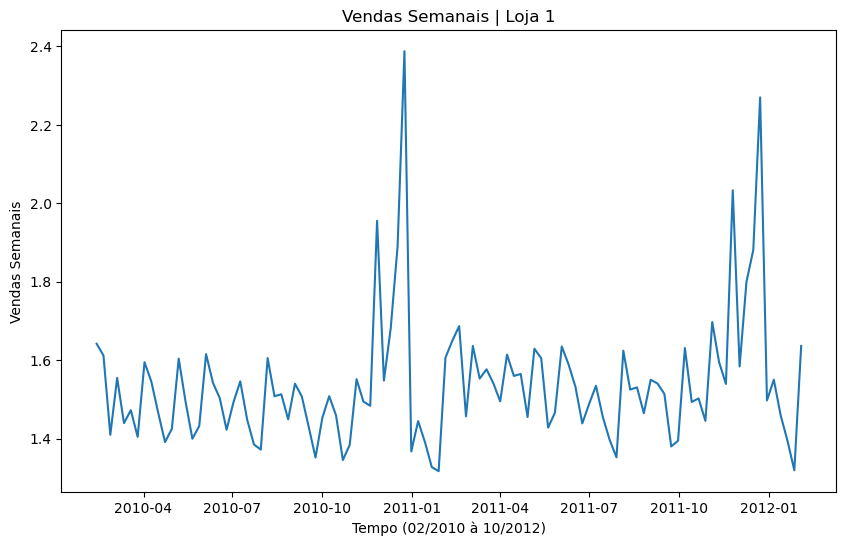

In [ ]:
# Visualizando série temporal
plt.figure(figsize=(10, 6))
plt.plot(serie_temp)
plt.title('Vendas Semanais | Loja 1')
plt.xlabel('Tempo (02/2010 à 10/2012)')
plt.ylabel('Vendas Semanais')
plt.show()

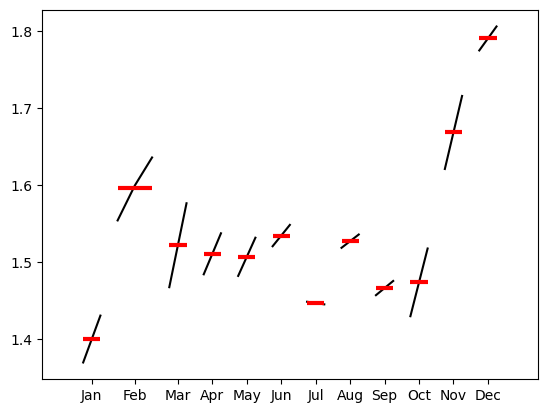

In [ ]:
# Visualizando série temporal (ocorrências Mês a Mês)
# É Possível visualizar com facilidade que o mês com maior fraqueza de vendas de fato é janeiro e que a partir de novembro os valores começam a saltar
# de forma expressiva. Além disso, um ponto interessante é que dentre todos os meses (desconsiderando novembro e dezembro), Fevereiro aparece com os
# melhores índices, que pode ser um fator específico regional daquela loja.

#Outro ponto a se avaliar, é que a tendência mostra que as vendas elas vão caindo constantemente de março à outubro.

serie_mensal = serie_temp.resample('ME').mean()

sm.graphics.tsa.month_plot(serie_mensal)

plt.show()

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

decompm = seasonal_decompose(serie_temp1, model='multiplicative', period=52)

In [ ]:
# observando os valores da decomposicao pelo modelo multiplicativo
#print(decompm.trend)
#print(decompm.seasonal)
#print(decompm.resid)

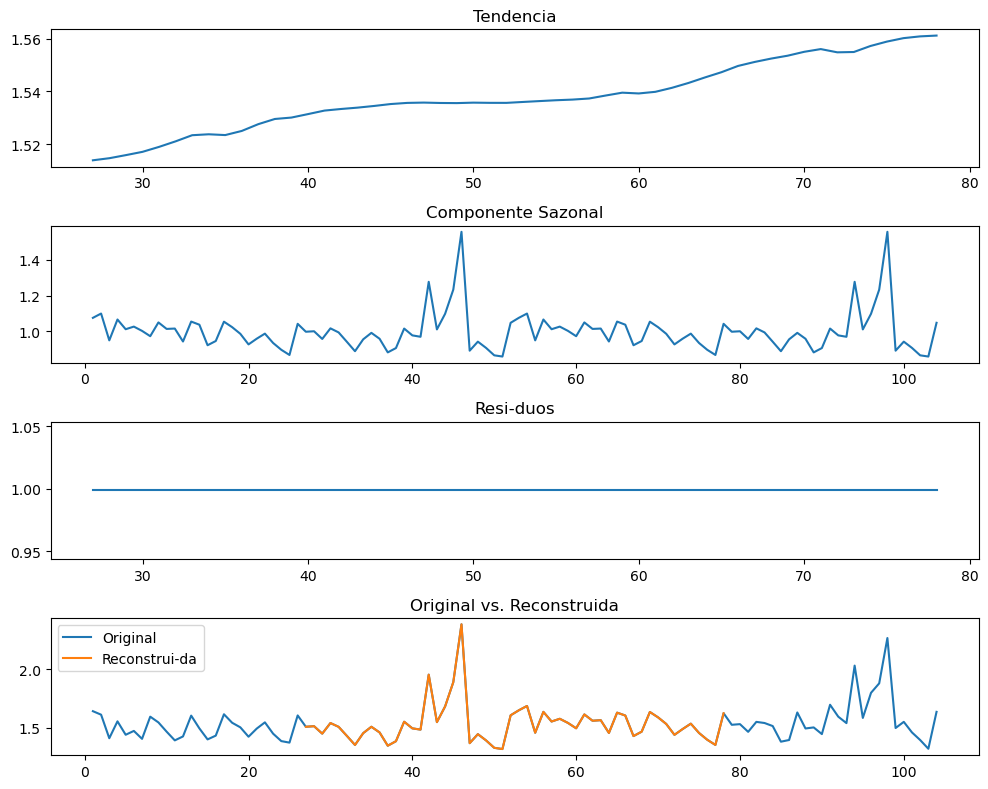

In [ ]:
# Plotar a decomposicao (Selecionar todos os comandos)
plt.figure(figsize=(10, 8))

plt.subplot(4, 1, 1)
plt.plot(decompm.trend)
plt.title('Tendencia')

plt.subplot(4, 1, 2)
plt.plot(decompm.seasonal)
plt.title('Componente Sazonal')

plt.subplot(4, 1, 3)
plt.plot(decompm.resid)
plt.title('Resi­duos')

plt.subplot(4, 1, 4)
plt.plot(serie_temp1, label='Original')
plt.plot(decompm.trend * decompm.seasonal * decompm.resid, label='Reconstrui­da')
plt.title('Original vs. Reconstruida')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Criando variável de Teste (Para avaliação do modelo)
teste = df['Weekly_Sales_Million'][df['Store']==1]
teste = teste[-38:]

In [ ]:
# Definir todas as combinações possíveis de modelos para ETS
configs = [
    {'trend': None, 'seasonal': None},
    {'trend': 'add', 'seasonal': None},
    {'trend': None, 'seasonal': 'add'},
    {'trend': 'add', 'seasonal': 'add'},
    {'trend': 'mul', 'seasonal': 'add'},
    {'trend': 'add', 'seasonal': 'mul'},
    {'trend': 'mul', 'seasonal': 'mul'}
]

best_aic = float('inf')
best_config = None
best_model = None

In [ ]:
# In[110]: Ajustar os modelos com diferentes configurações e comparar AIC
for config in configs:
    try:
        model = ExponentialSmoothing(serie_temp1, seasonal_periods=52, trend=config['trend'], seasonal=config['seasonal']).fit()
        aic = model.aic

        if aic < best_aic:
            best_aic = aic
            best_config = config
            best_model = model
    except Exception as e:
        pass  # Ignorar configurações que não funcionam

C:\Users\Felipe\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Felipe\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Felipe\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Felipe\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Felipe\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  

In [ ]:
# Exibir o melhor modelo com base no AIC
print(f"Melhor configuração: {best_config} com AIC = {best_aic}")
print(best_model.summary())

Melhor configuração: {'trend': 'add', 'seasonal': 'add'} com AIC = -622.0586947908387
                       ExponentialSmoothing Model Results                       
Dep. Variable:     Weekly_Sales_Million   No. Observations:                  104
Model:             ExponentialSmoothing   SSE                              0.089
Optimized:                         True   AIC                           -622.059
Trend:                         Additive   BIC                           -473.973
Seasonal:                      Additive   AICC                          -469.970
Seasonal Periods:                    52   Date:                 Thu, 29 May 2025
Box-Cox:                          False   Time:                         22:16:20
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level      

In [ ]:
# Previsão de 38 passos à frente (Quantidade da base de Teste) com o melhor modelo
best_forecasts = best_model.forecast(steps=38)
print("Previsão para os próximos 38 períodos:")
best_forecasts

Previsão para os próximos 38 períodos:


C:\Users\Felipe\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Felipe\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


104    1.717118
105    1.720746
106    1.504604
107    1.666876
108    1.567707
109    1.596008
110    1.544114
111    1.616361
112    1.651189
113    1.584313
114    1.549371
115    1.511418
116    1.687994
117    1.620833
118    1.485252
119    1.520369
120    1.696610
121    1.637062
122    1.589007
123    1.502083
124    1.561798
125    1.611790
126    1.523367
127    1.462341
128    1.433453
129    1.686292
130    1.588048
131    1.593277
132    1.528276
133    1.616558
134    1.595328
135    1.543676
136    1.437258
137    1.495299
138    1.640957
139    1.547813
140    1.495342
141    1.486061
dtype: float64

In [ ]:
# Cálculo do MAPE entre a previsão e os valores reais
quali_ETS = mape(teste, best_forecasts)*100
print(f'MAPE ETS:{round(quali_ETS,2)}%')

MAPE ETS:2.96%


In [35]:
# Assumindo que serie_temp1.index é datetime com frequência semanal
start_idx = teste.index[0]
forecast_idx = range(start_idx, start_idx + len(best_forecasts))

NameError: name 'teste' is not defined

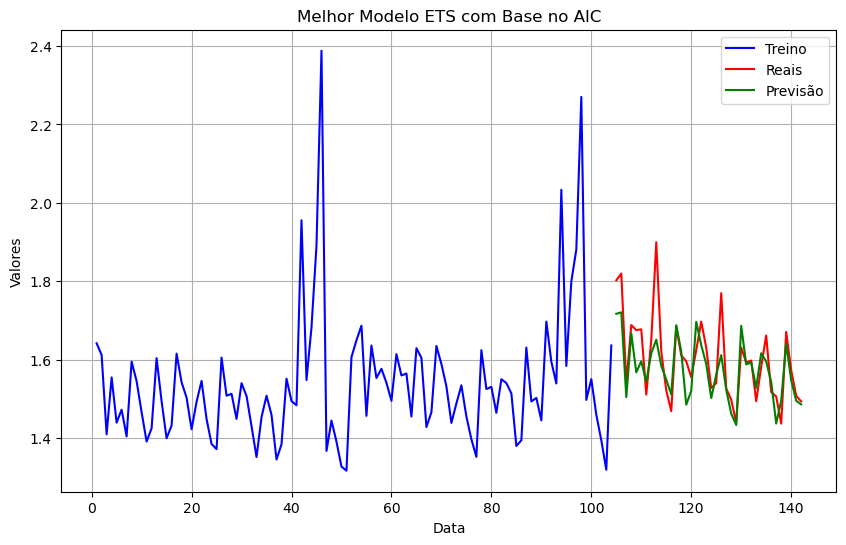

In [ ]:
# Visualização da série de treino, valores reais (teste) e previsões
plt.figure(figsize=(10, 6))
plt.plot(serie_temp1.index, serie_temp1, label="Treino", color='blue')
plt.plot(teste.index, teste, label="Reais", color='red')
plt.plot(forecast_idx, best_forecasts, label="Previsão", color='green')
plt.title("Melhor Modelo ETS com Base no AIC")
plt.xlabel("Data")
plt.ylabel("Valores")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Previsão de 48 passos à frente com o melhor modelo
best_forecasts1 = best_model.forecast(steps=48)
print("Previsão para os próximos 38 períodos:")

Previsão para os próximos 38 períodos:


C:\Users\Felipe\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Felipe\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


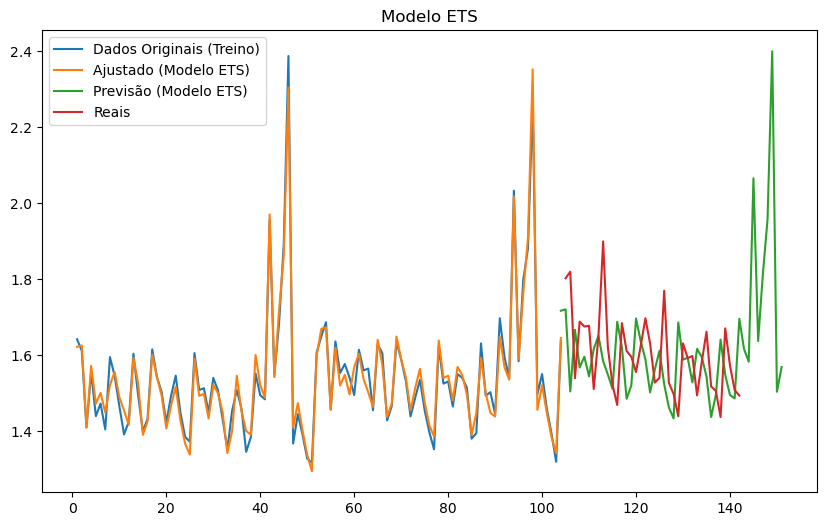

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(serie_temp1, label="Dados Originais (Treino)")
plt.plot(best_model.fittedvalues, label="Ajustado (Modelo ETS)")
plt.plot(np.arange(len(serie_temp1), len(serie_temp1) + 48), best_forecasts1, label="Previsão (Modelo ETS)")
plt.plot(teste, label="Reais")
plt.title("Modelo ETS")
plt.legend()
plt.show()

In [ ]:
# Última data conhecida (por exemplo, da série de treino/teste)
ultima_data = modelo_real_fitted['Data'].max()

# Cria uma sequência de datas semanais para os valores previstos
datas_forecast = pd.date_range(start=ultima_data + pd.Timedelta(weeks=1), periods=len(best_forecasts1), freq='W')

# Agora cria um DataFrame com os valores previstos e as datas
df_forecast = pd.DataFrame({
    'Data': datas_forecast,
    'Previsto': best_forecasts1.values  # ou forecast.squeeze() se for DataFrame de 1 coluna
})

vendas_previstas_2012 = df_forecast.head(9)
vendas_previstas_2012

,Data,Previsto
0,2012-11-04,1.717118
1,2012-11-11,1.720746
2,2012-11-18,1.504604
3,2012-11-25,1.666876
4,2012-12-02,1.567707
5,2012-12-09,1.596008
6,2012-12-16,1.544114
7,2012-12-23,1.616361
8,2012-12-30,1.651189


#### Preparação do DataFrame

In [ ]:
#lambda x: x =!2
#var = df.columns[[0,1,3,4,5,6,7,8]]
df_tree = df[var]
#df_tree['Month'] = df_tree['Date'].astype('str').str.split('-').str[1]

In [ ]:
df_tree['Week_Number'] = df_tree['Date'].dt.isocalendar().week

In [ ]:
#df_tree1 = df_tree.drop(columns=['Date'])
df_tree1

,Store,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Weekly_Sales_Million,Week_Number
0,1,0,42.31,2.572,211.096358,8.106,1.643691,5
1,1,1,38.51,2.548,211.242170,8.106,1.641957,6
2,1,0,39.93,2.514,211.289143,8.106,1.611968,7
3,1,0,46.63,2.561,211.319643,8.106,1.409728,8
4,1,0,46.50,2.625,211.350143,8.106,1.554807,9
...,...,...,...,...,...,...,...,...
6430,45,0,64.88,3.997,192.013558,8.684,0.713174,39
6431,45,0,64.89,3.985,192.170412,8.667,0.733455,40
6432,45,0,54.47,4.000,192.327265,8.667,0.734464,41
6433,45,0,56.47,3.969,192.330854,8.667,0.718126,42


In [ ]:
df_tree_dum = pd.get_dummies(df_tree1, columns=['Store','Week_Number'],dtype='int')

In [ ]:
df_tree_dum

,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Weekly_Sales_Million,Store_1,Store_2,Store_3,Store_4,...,Week_Number_43,Week_Number_44,Week_Number_45,Week_Number_46,Week_Number_47,Week_Number_48,Week_Number_49,Week_Number_50,Week_Number_51,Week_Number_52
0,0,42.31,2.572,211.096358,8.106,1.643691,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,38.51,2.548,211.242170,8.106,1.641957,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,39.93,2.514,211.289143,8.106,1.611968,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,46.63,2.561,211.319643,8.106,1.409728,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,46.50,2.625,211.350143,8.106,1.554807,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6430,0,64.88,3.997,192.013558,8.684,0.713174,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6431,0,64.89,3.985,192.170412,8.667,0.733455,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6432,0,54.47,4.000,192.327265,8.667,0.734464,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6433,0,56.47,3.969,192.330854,8.667,0.718126,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
